In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
 
from scipy import stats
%matplotlib inline
sns.set(style = "darkgrid", font_scale = 1.5)
pd.set_option("display.max.columns", None)
pd.set_option("display.max.rows", None)

import warnings
warnings.filterwarnings("ignore")

## Health Indicators

Life expectancy → Average number of years a person is expected to live in that country for that year.

Adult Mortality → Probability of dying between ages 15 and 60 per 1000 population (higher means worse health outcomes).

infant deaths → Number of deaths of infants (age < 1 year) per 1000 population.

under-five deaths → Number of deaths of children under age 5 per 1000 population.

HIV/AIDS → Deaths per 1000 people due to HIV/AIDS.

thinness 1-19 years → Percentage of population aged 1–19 who are underweight.

thinness 5-9 years → Percentage of children aged 5–9 who are underweight.


## Immunization Coverage

Hepatitis B → Percentage of 1-year-old children immunized against Hepatitis B.

Polio → Percentage of 1-year-old children immunized against Polio.

Diphtheria → Percentage of 1-year-old children immunized against Diphtheria, Pertussis (whooping cough), and Tetanus (DPT).

Measles → Number of reported measles cases per 1000 population.


## Lifestyle / Health Expenditure

Alcohol → Per capita (average per person) consumption of alcohol in liters per year.

BMI → Average Body Mass Index of the population.

percentage expenditure → Expenditure on health as a percentage of GDP per capita.

Total expenditure → Government expenditure on health as a percentage of total government expenditure.


## Economy & Resources

GDP → Gross Domestic Product per capita (in USD).

Income composition of resources → Human Development Index (HDI)-like measure of income composition (values between 0 and 1, higher is better).

Schooling → Average number of years of schooling in the population.

Population → Population of the country for that year.

## Bivariate Analysis (two variables at a time)

Goal: find relationships, correlations, and contrasts.

### Numeric vs Numeric

Scatter plots (Life expectancy vs GDP, Life expectancy vs Schooling, etc.). DONE

Pairplots (e.g., Seaborn pairplot) to see clusters. DONE

Correlation heatmap (Pearson/Spearman). DONE

Regression plots (GDP vs Life expectancy, BMI vs Life expectancy).

### Numeric vs Categorical (if categorical exists like Region/Year/Income group)

Boxplots / violin plots (Life expectancy by Country). DONE.

Bar charts with error bars (Average immunization by Country).

In [7]:
df = pd.read_csv("data_life_expectancy_clean.zip")
print(df.sample(5))

        Country  Year      Status  Life Expectancy  Adult Mortality  \
2317  Singapore  2011   Developed             82.2              6.0   
1865  Nicaragua  2011  Developing             74.5            147.0   
769    Dominica  2013  Developing              NaN              NaN   
2049     Poland  2005   Developed             75.0            144.0   
761    Djibouti  2007  Developing             59.8            296.0   

      Infant Deaths  Alcohol  Percentage Expenditure  Hepatitis B  Measles  \
2317              0     1.80              638.000110         96.0      148   
1865              3     3.39              321.613259         98.0        0   
769               0     0.01               11.419555         96.0        0   
2049              2     9.50               79.415027         98.0       13   
761               1     0.45               20.868787         25.0       24   

       Bmi  Under-Five Deaths  Polio  Total Expenditure  Diphtheria  Hiv/Aids  \
2317  32.1             

In [13]:
# Lets create a df that contains numeric values
df_numeric = df.select_dtypes(include = [np.number])
print(df_numeric.head(5))

# Lets create a df that contains categorical values
df_categ = df.select_dtypes(include = ['object'])
print(df_categ.head(5))

   Year  Life Expectancy  Adult Mortality  Infant Deaths  Alcohol  \
0  2015             65.0            263.0             62     0.01   
1  2014             59.9            271.0             64     0.01   
2  2013             59.9            268.0             66     0.01   
3  2012             59.5            272.0             69     0.01   
4  2011             59.2            275.0             71     0.01   

   Percentage Expenditure  Hepatitis B  Measles   Bmi  Under-Five Deaths  \
0               71.279624         65.0     1154  19.1                 83   
1               73.523582         62.0      492  18.6                 86   
2               73.219243         64.0      430  18.1                 89   
3               78.184215         67.0     2787  17.6                 93   
4                7.097109         68.0     3013  17.2                 97   

   Polio  Total Expenditure  Diphtheria  Hiv/Aids         GDP  Population  \
0    6.0               8.16        65.0       0.1  

## scatter plot of Life Expectancy versus other numeric columns

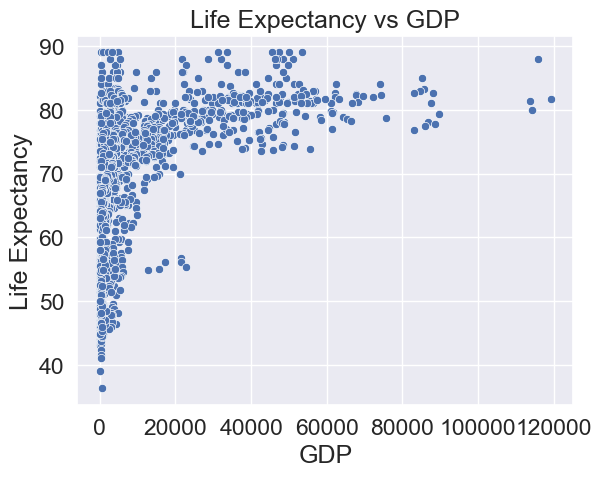

In [14]:
# LE vs GDP
sns.scatterplot(x='GDP', y='Life Expectancy', data=df)
plt.title('Life Expectancy vs GDP')
plt.show()


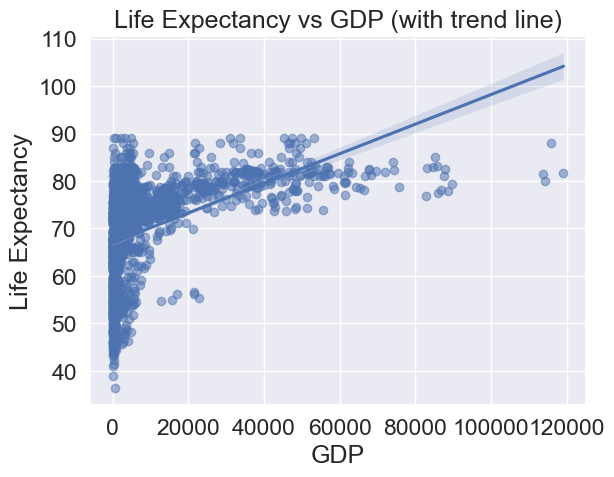

In [15]:
# lets plot the reg line of LE vs GDP
sns.regplot(x='GDP', y='Life Expectancy', data=df, scatter_kws={'alpha':0.5})
plt.title('Life Expectancy vs GDP (with trend line)')
plt.show()

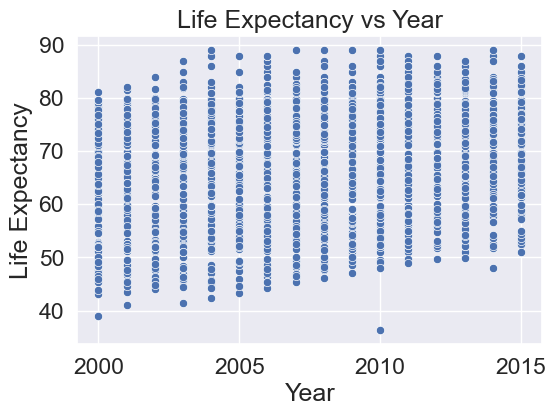

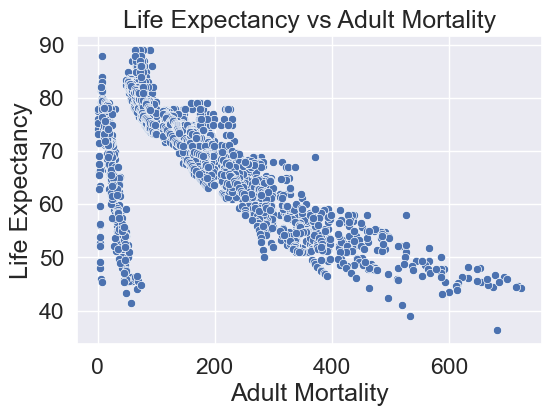

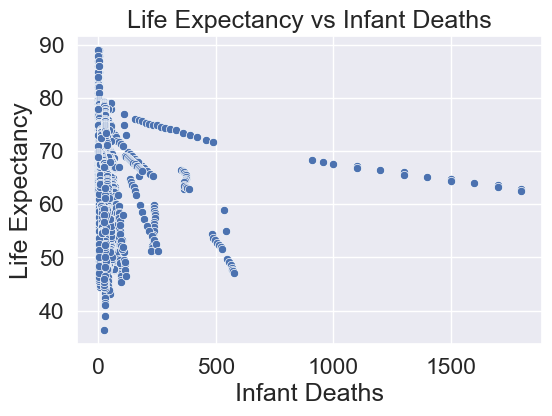

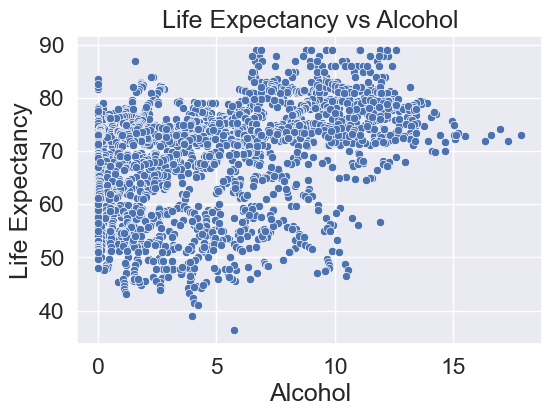

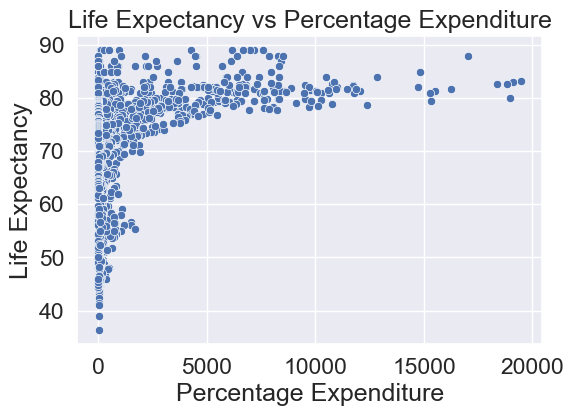

...

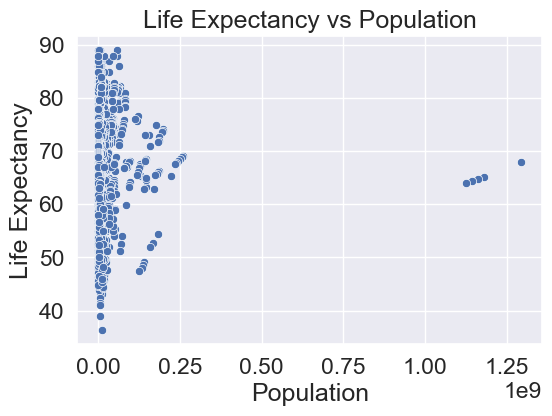

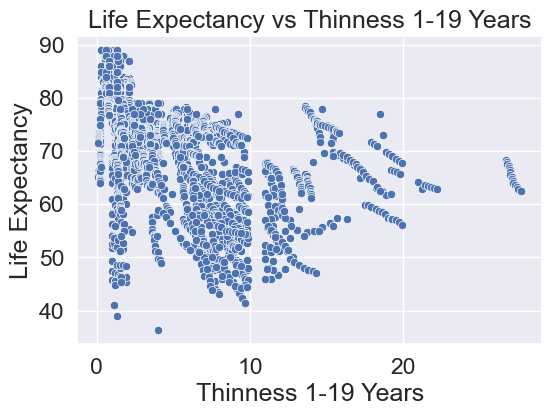

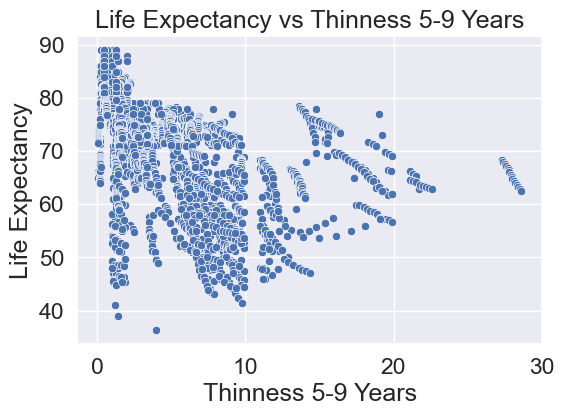

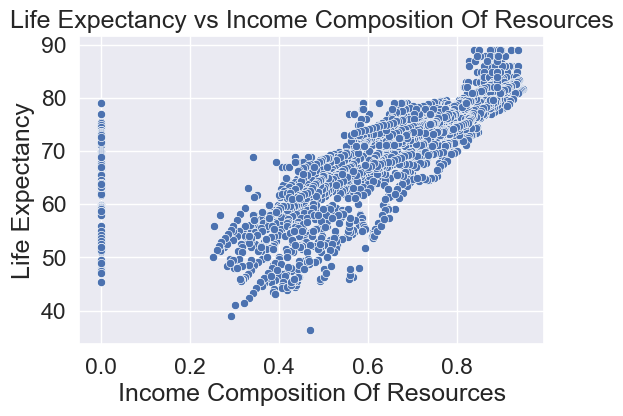

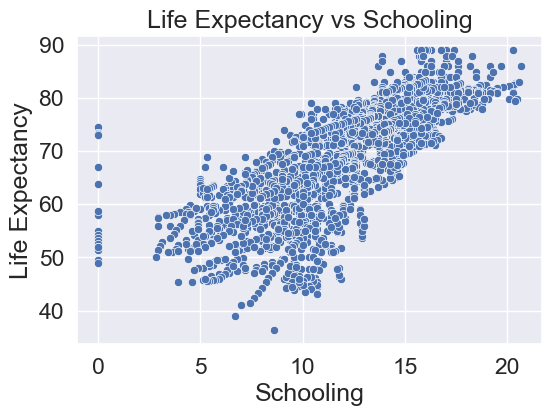

In [18]:
# Lets plot LE vs all other numeric columns

numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
numeric_cols = [col for col in numeric_cols if col != 'Life Expectancy']

for col in numeric_cols:
    plt.figure(figsize=(6,4))
    sns.scatterplot(x=df[col], y=df['Life Expectancy'])
    plt.xlabel(col)
    plt.ylabel('Life Expectancy')
    plt.title(f'Life Expectancy vs {col}')
    plt.show()


In [26]:
# NO good...its all jumbled

# sns.scatterplot(x='GDP', y='Life Expectancy', 
#                 size='Population', hue='Country', data=df, alpha=0.6)
# plt.title('Life Expectancy vs GDP (bubble = population, color = region)')
# plt.show()


## pairplot

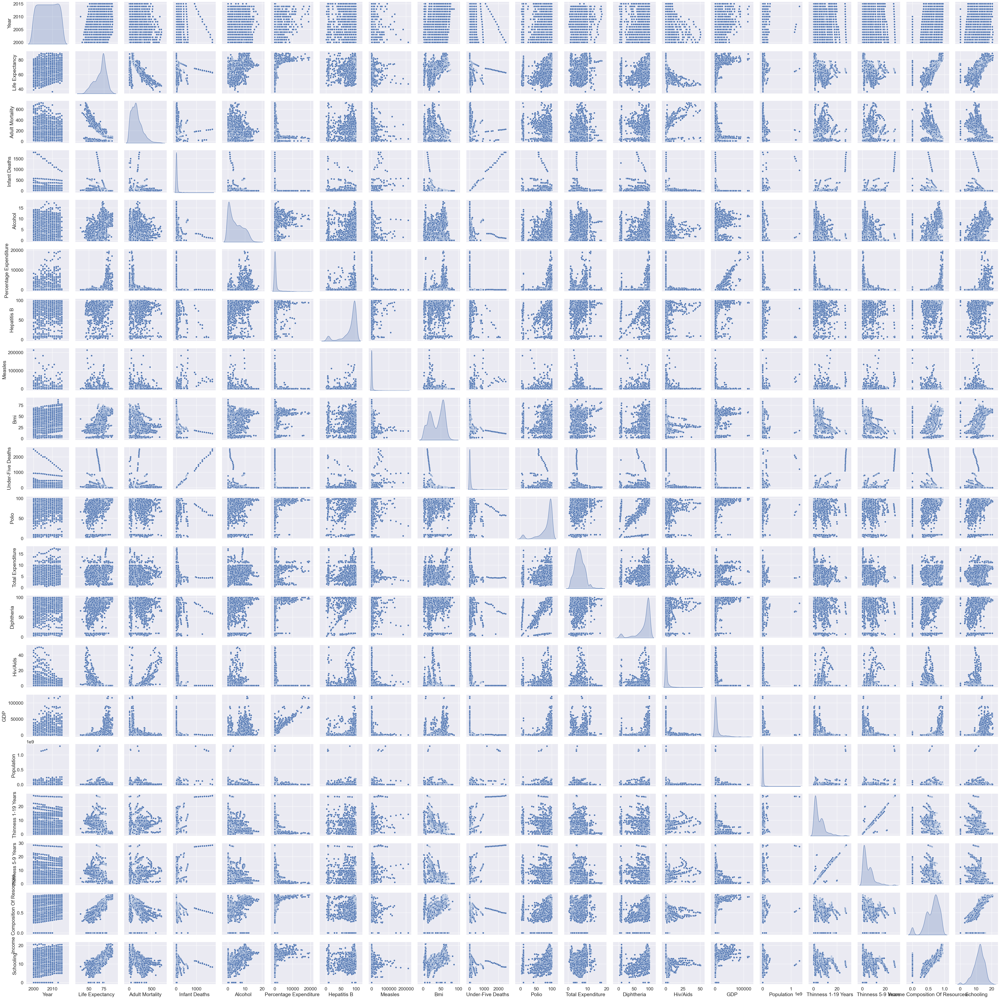

In [27]:
# This took 2-3 minutes
# STEP1: Select only numeric columns
df_numeric = df.select_dtypes(include=['float64', 'int64'])

sns.pairplot(df_numeric, diag_kind='kde')  # use 'hist' for histograms
plt.show()

Under-Five Deaths                Infant Deaths                      0.996629
Infant Deaths                    Under-Five Deaths                  0.996629
Thinness 1-19 Years              Thinness 5-9 Years                 0.939102
Thinness 5-9 Years               Thinness 1-19 Years                0.939102
GDP                              Percentage Expenditure             0.899373
Percentage Expenditure           GDP                                0.899373
Schooling                        Income Composition Of Resources    0.800092
Income Composition Of Resources  Schooling                          0.800092
Schooling                        Life Expectancy                    0.751975
Life Expectancy                  Schooling                          0.751975
dtype: float64
####
Variables with high correlation: {'Diphtheria', 'Life Expectancy', 'Schooling', 'Under-Five Deaths', 'Infant Deaths', 'Thinness 1-19 Years', 'Income Composition Of Resources', 'Polio', 'Hepatitis B', 'Adult Mor

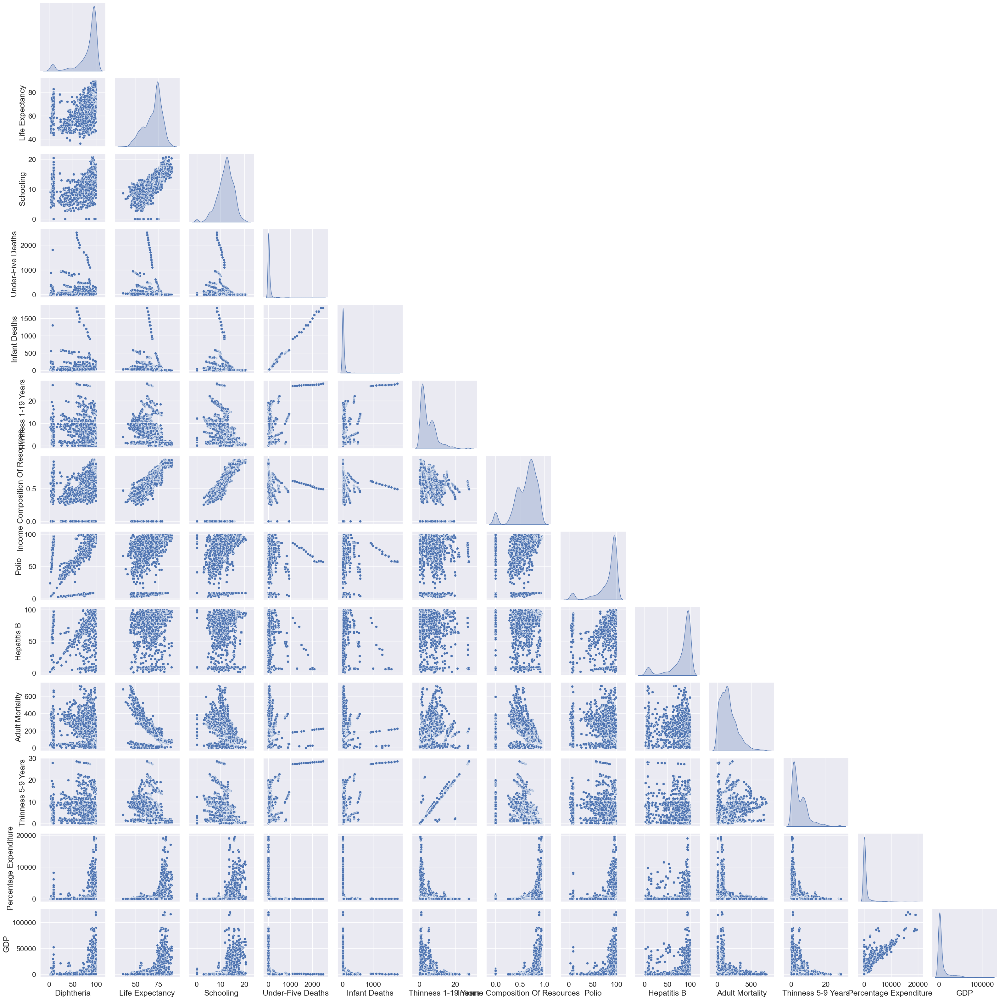

In [28]:
# This took 1-2 minutes

# step2: The above is little hard to read. So work with only those variables that have corr coef > 0.6
corr = df.corr(numeric_only=True)   # correlation matrix

threshold = 0.6
high_corr = corr.abs().unstack().sort_values(ascending=False)

# Remove self-correlations
high_corr = high_corr[high_corr < 1]

# Show top correlated pairs
print(high_corr[high_corr > threshold].head(10))
print("####")

# Get the unique variable names involved
high_corr_vars = set(high_corr[high_corr > threshold].index.get_level_values(0)) | \
                 set(high_corr[high_corr > threshold].index.get_level_values(1))

print("Variables with high correlation:", high_corr_vars)

sns.pairplot(df[list(high_corr_vars)], diag_kind='kde', corner=True)
plt.show()

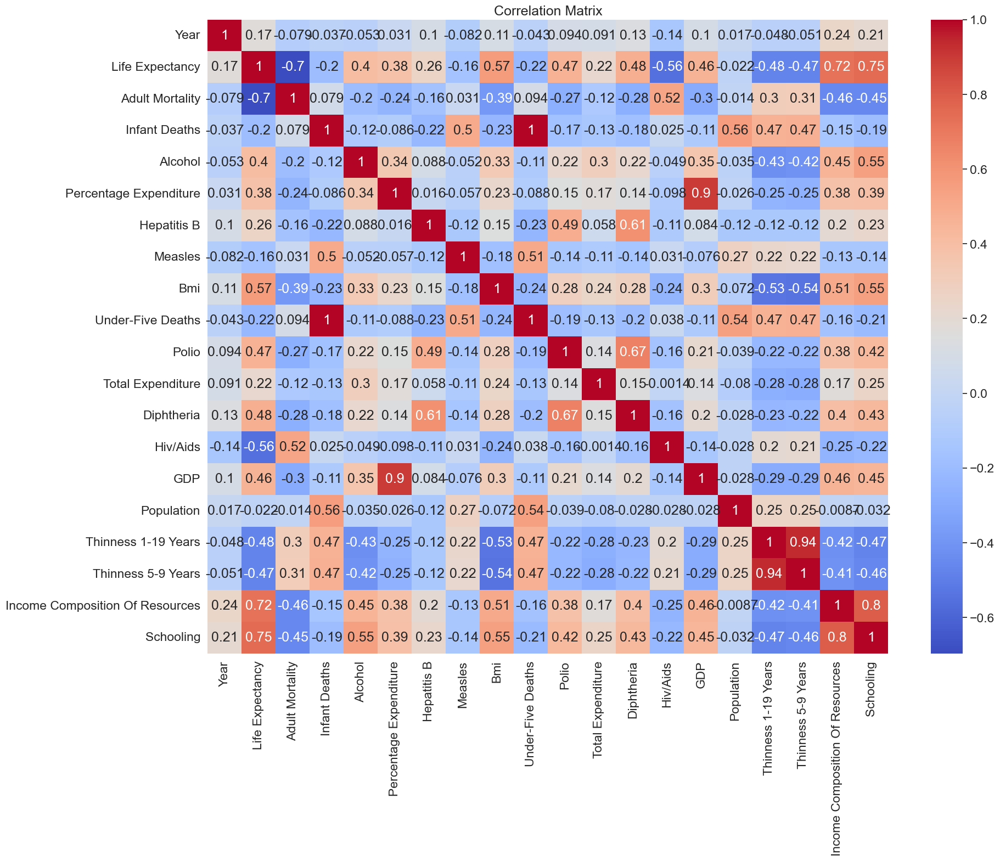

In [23]:
# Lets compute the correlation matrix for numeric columns and visualize it
correlation_matrix = numerical_df.corr(numeric_only=True)

plt.figure(figsize = (20,15))
sns.heatmap(correlation_matrix, annot = True, cmap = "coolwarm")
plt.title("Correlation Matrix")
plt.show()

# Observation:
# There is a very high corelation between
# - infant deaths and under-five deaths
# - percentage expenditure and GDP
# - Income composition of resources and Schooling
# - Life expectancy and Income composition of resources
# - Schooling and Life expectancy
# Column Under 5 death and infant death have corr_coeff = 1. So in essence they are same columns 

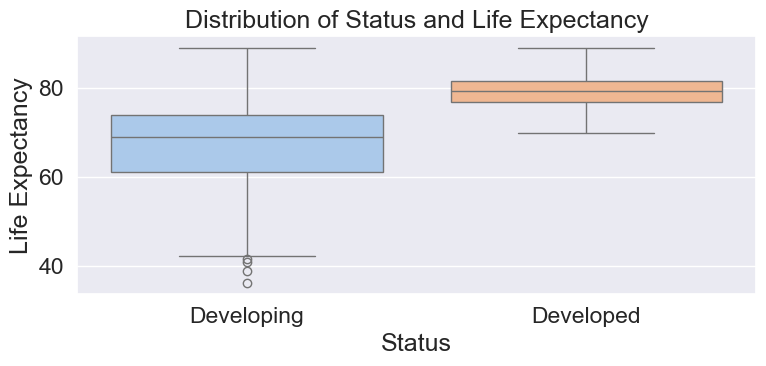

In [21]:
# step1: Lets compare life expectancy of developed and developing countries using boxplot: (Bivariate analysis)
plt.figure(figsize = (8,4))
sns.boxplot(data = df, x="Status", y="Life Expectancy", palette = 'pastel')
plt.title("Distribution of Status and Life Expectancy")
plt.xlabel("Status")
plt.ylabel("Life Expectancy")
plt.tight_layout()
plt.show()

# observation: LE is higher for developed country


In [22]:
# step2: I want to know the exact value of min and max for LE for developed and developing country
df_developing = df[df['Status'] == 'Developing']
print("min for developing=", df_developing['Life Expectancy'].min())
print("max for developing=", df_developing['Life Expectancy'].max())

df_developed = df[df['Status'] == 'Developed']
print("min for developed=", df_developed['Life Expectancy'].min())
print("max for developed=", df_developed['Life Expectancy'].max())

min for developing= 36.3
max for developing= 89.0
min for developed= 69.9
max for developed= 89.0


In [ ]:
## Numeric vs categorical

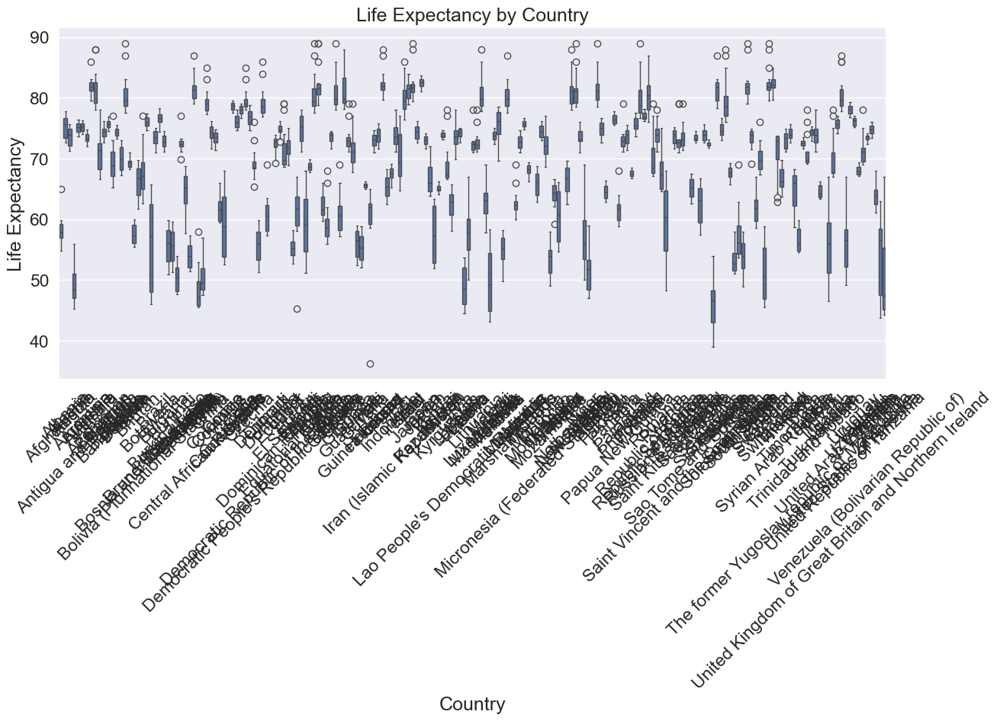

In [31]:
# step1: boxplot
plt.figure(figsize=(14, 6))
sns.boxplot(x="Country", y="Life Expectancy", data=df)
plt.xticks(rotation=60)  # rotate x-axis labels for readability
plt.title("Life Expectancy by Country")
plt.show()

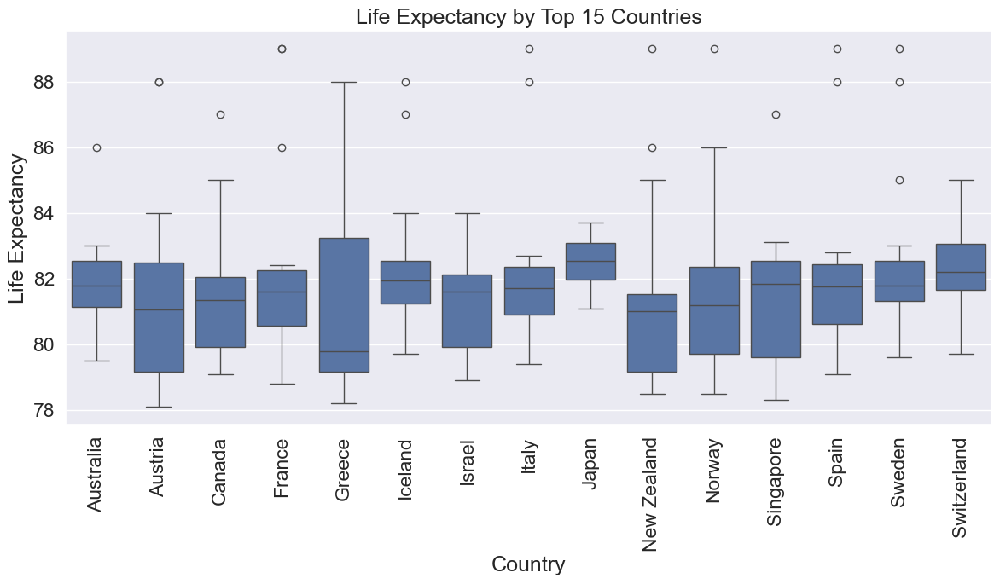

In [35]:
# step2: Its hard to read. So lets filter top N countries by mean life expectancy:
top_countries = (
    df.groupby("Country")["Life Expectancy"]
    .mean()
    .sort_values(ascending=False)
    .head(15)  # pick top 15
    .index
)

plt.figure(figsize=(14, 6))
sns.boxplot(x="Country", y="Life Expectancy", data=df[df["Country"].isin(top_countries)])
plt.xticks(rotation=90)
plt.title("Life Expectancy by Top 15 Countries")
plt.show()


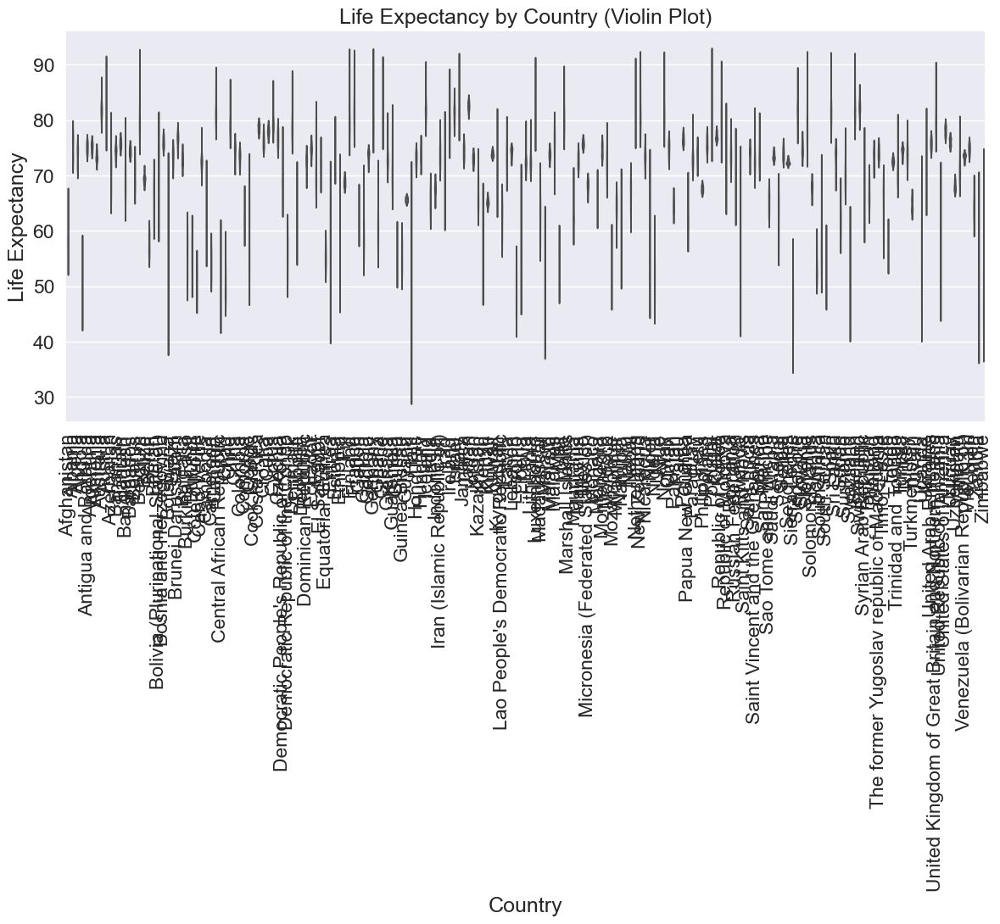

In [33]:
# step1: violinplot
plt.figure(figsize=(14, 6))
sns.violinplot(x="Country", y="Life Expectancy", data=df, inner="quartile")
plt.xticks(rotation=90)
plt.title("Life Expectancy by Country (Violin Plot)")
plt.show()

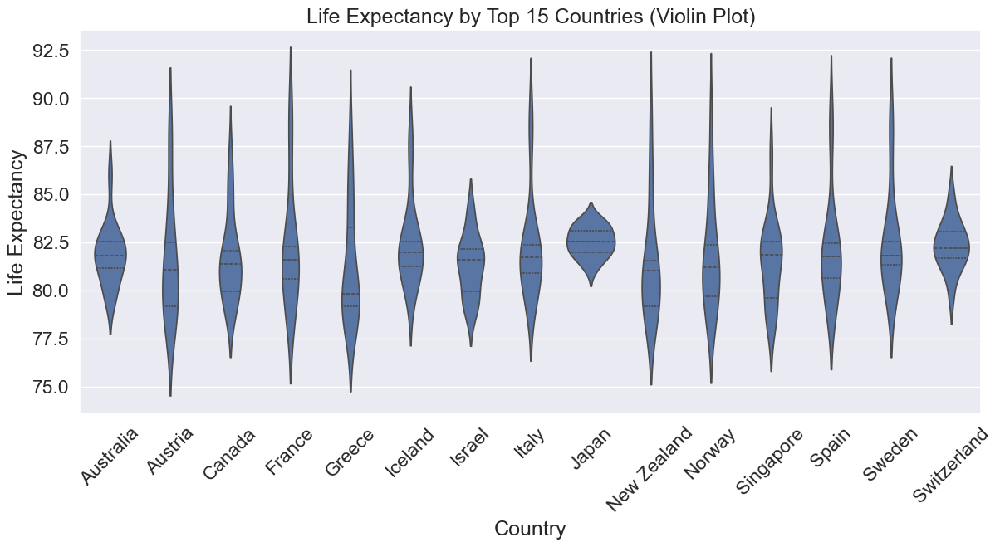

In [36]:
# step2: The above is hard to read. So lets
top_countries = (
    df.groupby("Country")["Life Expectancy"]
    .mean()
    .sort_values(ascending=False)
    .head(15)   # Top 15 countries
    .index
)

plt.figure(figsize=(14, 6))
sns.violinplot(
    x="Country", 
    y="Life Expectancy", 
    data=df[df["Country"].isin(top_countries)], 
    inner="quartile"
)
plt.xticks(rotation=45)
plt.title("Life Expectancy by Top 15 Countries (Violin Plot)")
plt.show()


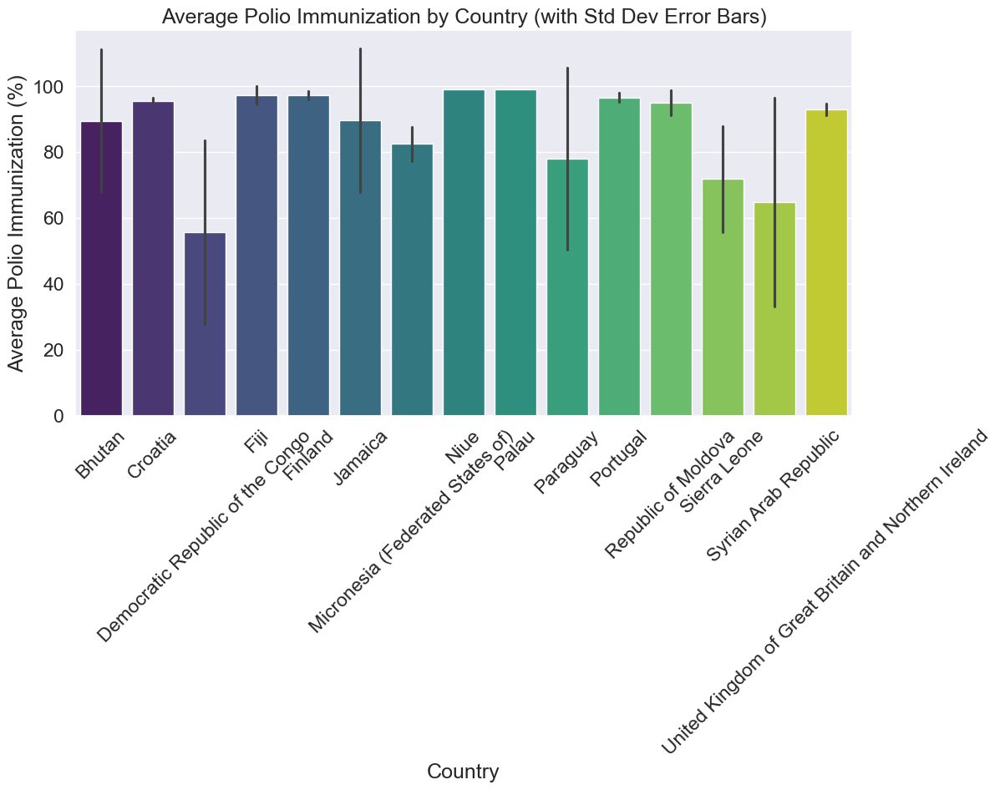

In [40]:

# Group by country: mean & std
immunization_stats = (
    df.groupby("Country")["Polio"]
    .agg(["mean", "std"])
    .reset_index()
    .sort_values("mean", ascending=False)
    .sample(15)   # Top 15 countries
)

plt.figure(figsize=(12, 6))
sns.barplot(
    x="Country", 
    y="Polio", 
    data=df[df["Country"].isin(immunization_stats["Country"])],
    estimator="mean",   # mean as height
    errorbar="sd",      # show standard deviation as error bar
    palette="viridis"
)
plt.xticks(rotation=45)
plt.ylabel("Average Polio Immunization (%)")
plt.title("Average Polio Immunization by Country (with Std Dev Error Bars)")
plt.show()

In [ ]:
## TO BE CONTINUED.....